In [50]:
import cv2
import numpy as np
import pandas as pd
import os
from collections import defaultdict
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import joblib
from sklearn.metrics import pairwise
from sklearn.cluster import KMeans

# Define chocolate class names
CHOCOLATE_CLASSES = {
    "Noblesse", "Amandina", "Passion au lait", "Creme brulee", "Stracciatella",
    "Jelly Milk", "Triangolo", "Jelly White", "Jelly Black", "Arabia",
    "Comtesse", "Noir authentique", "Tentation noir"
}

# --------- Step 1: K-means Color Clustering ---------
def kmeans_clustering(image, k=4):
    Z = image.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(Z)
    labels = kmeans.labels_.reshape(image.shape[:2])
    clustered_img = kmeans.cluster_centers_[labels].reshape(image.shape).astype(np.uint8)
    return clustered_img, labels

def get_contours_from_mask(mask, min_area=1500, size_range=(200, 1200)):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered = []
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        if (min_area < cv2.contourArea(c) and size_range[0] <= w <= size_range[1] and size_range[0] <= h <= size_range[1]):
            filtered.append(c)
    return filtered

def extract_histogram(img, contour):
    x, y, w, h = cv2.boundingRect(contour)
    roi = img[y:y+h, x:x+w]
    hist = cv2.calcHist([roi], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
    cv2.normalize(hist, hist)
    return hist.flatten(), roi


def extract_features_from_multiple_annotations(csv_paths, train_folder):
    X, y = [], []

    for csv_path in csv_paths:
        df = pd.read_csv(csv_path)

        for _, row in df.iterrows():
            img_path = os.path.join(train_folder, row['filename'])
            img = cv2.imread(img_path)
            if img is None:
                continue

            x_min, y_min, x_max, y_max = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])
            label = row['class']
            roi = img[y_min:y_max, x_min:x_max]
            if roi.size == 0:
                continue

            gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if not contours:
                continue

            c = max(contours, key=cv2.contourArea)

            hist = cv2.calcHist([roi], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
            cv2.normalize(hist, hist)
            hu = cv2.HuMoments(cv2.moments(c)).flatten()

            features = np.concatenate([hist.flatten(), hu])
            X.append(features)
            y.append(label)

    return np.array(X), np.array(y)

def train_svm_classifier(X, y):
    model = make_pipeline(StandardScaler(), SVC(kernel='rbf', probability=True))
    model.fit(X, y)
    return model

def extract_class_masks(labels):
    masks = []
    for val in np.unique(labels):
        masks.append((labels == val).astype(np.uint8) * 255)
    return masks

def clean_mask(mask):
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

def filter_boxes_by_size_and_overlap(contours, labels, scores, size_bounds=(350, 700), iou_thresh=0.1):
    filtered = []
    boxes = [cv2.boundingRect(c) for c in contours]

    for i, (cnt1, label1, score1, box1) in enumerate(zip(contours, labels, scores, boxes)):
        x1, y1, w1, h1 = box1
        if not (size_bounds[0] <= w1 <= size_bounds[1] and size_bounds[0] <= h1 <= size_bounds[1]):
            continue
        if label1 not in CHOCOLATE_CLASSES:
            continue
        keep = True
        for j, (cnt2, label2, score2, box2) in enumerate(zip(contours, labels, scores, boxes)):
            if i == j:
                continue
            x2, y2, w2, h2 = box2
            xi1 = max(x1, x2)
            yi1 = max(y1, y2)
            xi2 = min(x1 + w1, x2 + w2)
            yi2 = min(y1 + h1, y2 + h2)
            inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
            box1_area = w1 * h1
            box2_area = w2 * h2
            iou = inter_area / float(box1_area + box2_area - inter_area)
            if iou > iou_thresh and score2 > score1:
                keep = False
                break
        if keep:
            filtered.append((cnt1, label1))
    return zip(*filtered) if filtered else ([], [])

def display_results(original_img, clustered_img, all_contours, all_labels):
    vis1 = clustered_img.copy()
    vis2 = original_img.copy()
    vis3 = original_img.copy()

    for cnt in all_contours:
        cv2.drawContours(vis1, [cnt], -1, (0, 255, 0), 2)

    for cnt, label in zip(all_contours, all_labels):
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(vis2, (x, y), (x+w, y+h), (255, 0, 0), 2)
        cv2.rectangle(vis3, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(vis3, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 6, (0, 0, 255), 6)

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1); plt.imshow(cv2.cvtColor(vis1, cv2.COLOR_BGR2RGB)); plt.title("K-means Contours")
    plt.subplot(1, 3, 2); plt.imshow(cv2.cvtColor(vis2, cv2.COLOR_BGR2RGB)); plt.title("Filtered Boxes")
    plt.subplot(1, 3, 3); plt.imshow(cv2.cvtColor(vis3, cv2.COLOR_BGR2RGB)); plt.title("Classified Chocolates")
    plt.tight_layout()
    plt.show()


def process_image_kmeans_svm(img_path, svm_model):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Failed to read image {img_path}")
        return

    clustered_img, labels = kmeans_clustering(img, k=4)
    class_masks = extract_class_masks(labels)

    all_contours = []
    all_labels = []
    all_scores = []

    for mask in class_masks:
        cleaned = clean_mask(mask)
        contours = get_contours_from_mask(cleaned)
        for cnt in contours:
            hist, roi = extract_histogram(img, cnt)
            gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            roicontours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if not roicontours:
                continue
            rc = max(roicontours, key=cv2.contourArea)
            hu = cv2.HuMoments(cv2.moments(rc)).flatten()
            features = np.concatenate([hist, hu])

            probas = svm_model.predict_proba([features])[0]
            predicted_idx = np.argmax(probas)
            predicted = svm_model.classes_[predicted_idx]
            confidence = probas[predicted_idx]

            if predicted not in CHOCOLATE_CLASSES:
                continue

            all_contours.append(cnt)
            all_labels.append(predicted)
            all_scores.append(confidence)

    final_contours, final_labels = filter_boxes_by_size_and_overlap(all_contours, all_labels, all_scores)
    display_results(img, clustered_img, final_contours, final_labels)
    display_results(img, clustered_img, all_contours, all_labels)

# Usage example (outside this module):
# X, y = extract_features_from_annotations("train.csv", "train_images")
# model = train_svm_classifier(X, y)
# joblib.dump(model, "svm_model.pkl")
# model = joblib.load("svm_model.pkl")
# process_image_kmeans_svm("test_images/img1.jpg", model)


In [35]:
csvs = [r'data\_annotations.csv', r'data\_annotations_objects.csv']
X, y = extract_features_from_multiple_annotations(csvs, r'images\train_total')
model = train_svm_classifier(X, y)  # or KNN, if you want
joblib.dump(model, "svm_model_new.pkl")
                         

['svm_model_new.pkl']

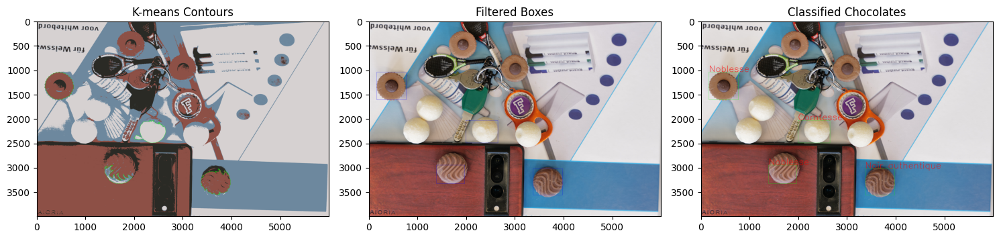

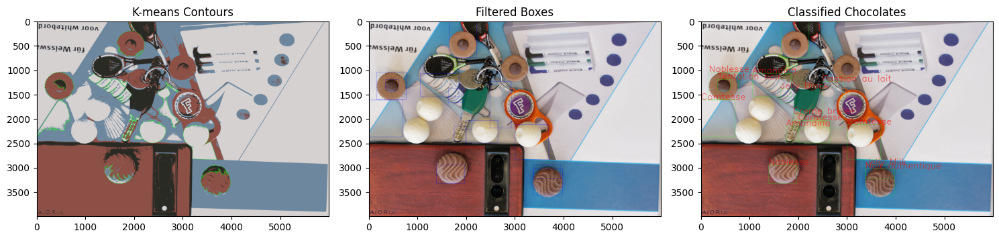

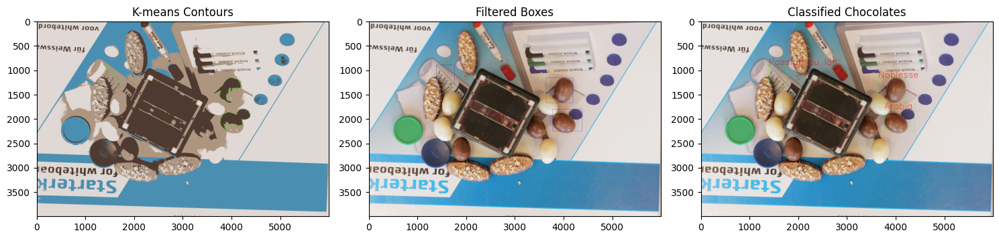

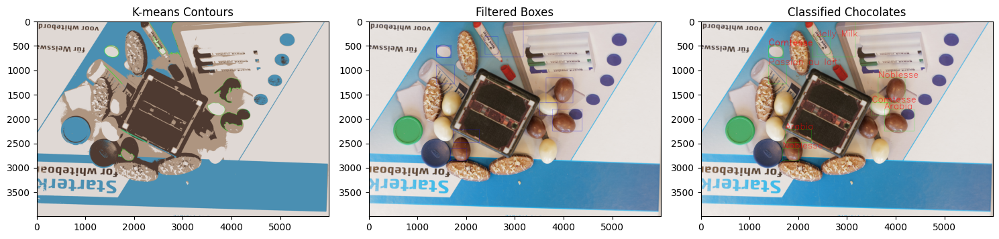

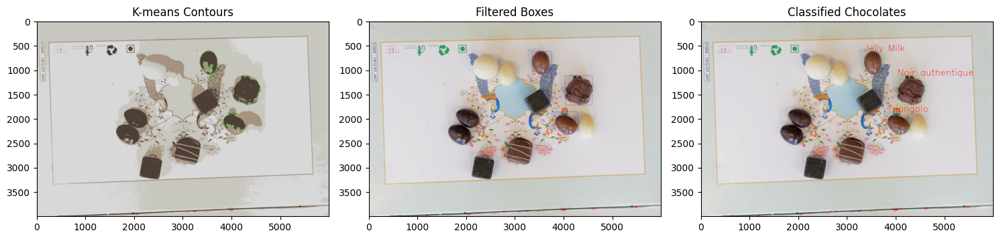

...

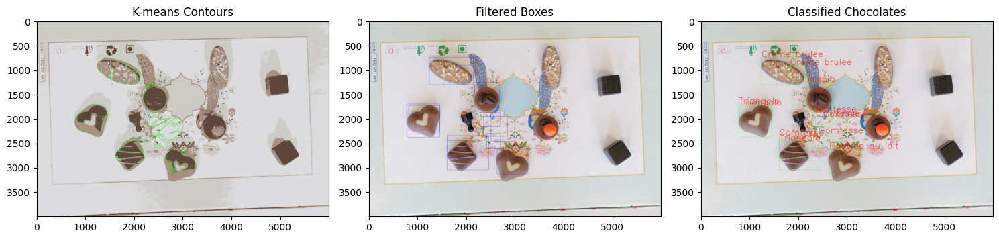

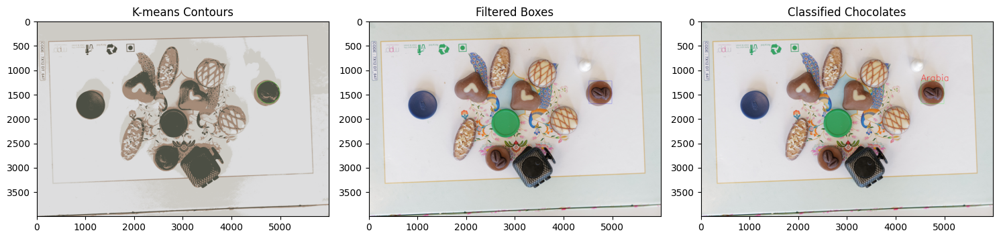

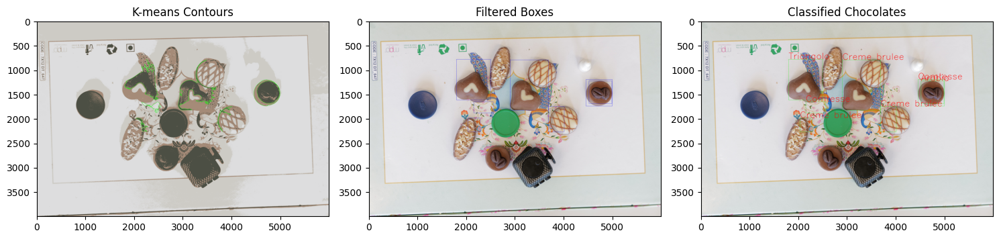

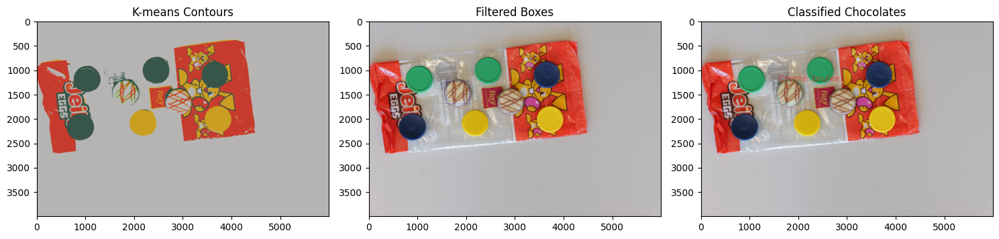

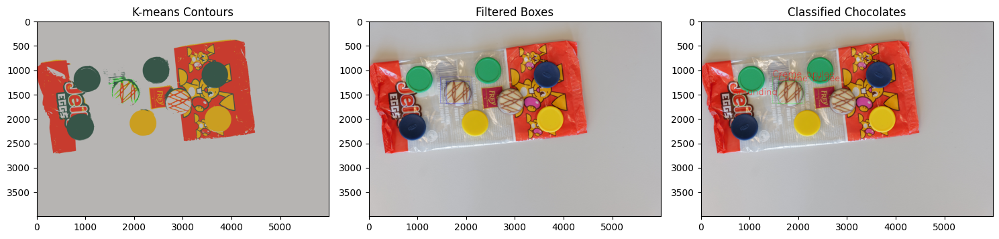

In [51]:
model = joblib.load(r'svm_model_new.pkl')
test_folder = r'images\test_small'
for filename in os.listdir(test_folder):
    if filename.endswith('.JPG'):
        img_path = os.path.join(test_folder, filename)
        process_image_kmeans_svm(img_path, model)

In [57]:
import cv2
import numpy as np
import pandas as pd
import os
from collections import defaultdict
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import joblib

# --------- Step 1: Feature Extraction ---------
def extract_histogram(img):
    hist = cv2.calcHist([img], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
    cv2.normalize(hist, hist)
    return hist.flatten()

def extract_hu_moments(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        c = max(contours, key=cv2.contourArea)
        return cv2.HuMoments(cv2.moments(c)).flatten()
    else:
        return np.zeros(7)

def extract_features_from_multiple_annotations(csv_paths, train_folder):
    X, y = [], []
    for csv_path in csv_paths:
        df = pd.read_csv(csv_path)
        for _, row in df.iterrows():
            img_path = os.path.join(train_folder, row['filename'])
            img = cv2.imread(img_path)
            if img is None:
                continue
            x_min, y_min, x_max, y_max = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])
            label = row['class']
            roi = img[y_min:y_max, x_min:x_max]
            if roi.size == 0:
                continue
            hist = extract_histogram(roi)
            hu = extract_hu_moments(roi)
            features = np.concatenate([hist, hu])
            X.append(features)
            y.append(label)
    return np.array(X), np.array(y)

def train_svm_classifier(X, y):
    model = make_pipeline(StandardScaler(), SVC(kernel='rbf', probability=True))
    model.fit(X, y)
    return model

def sliding_window_classification(img_path, model, window_size=(300, 300), step_size=100, confidence_thresh=0.7):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Failed to read image {img_path}")
        return

    detections = []
    for y in range(0, img.shape[0] - window_size[1], step_size):
        for x in range(0, img.shape[1] - window_size[0], step_size):
            window = img[y:y+window_size[1], x:x+window_size[0]]
            hist = extract_histogram(window)
            hu = extract_hu_moments(window)
            features = np.concatenate([hist, hu])

            probas = model.predict_proba([features])[0]
            predicted_idx = np.argmax(probas)
            predicted = model.classes_[predicted_idx]
            confidence = probas[predicted_idx]

            if confidence > confidence_thresh:
                detections.append((x, y, window_size[0], window_size[1], predicted, confidence))

    # Non-Maximum Suppression (NMS)
    final_detections = []
    for i in range(len(detections)):
        x1, y1, w1, h1, label1, conf1 = detections[i]
        keep = True
        for j in range(len(detections)):
            if i == j:
                continue
            x2, y2, w2, h2, label2, conf2 = detections[j]
            xi1, yi1 = max(x1, x2), max(y1, y2)
            xi2, yi2 = min(x1 + w1, x2 + w2), min(y1 + h1, y2 + h2)
            inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
            box1_area = w1 * h1
            box2_area = w2 * h2
            iou = inter_area / float(box1_area + box2_area - inter_area)
            if iou > 0.3 and conf2 > conf1:
                keep = False
                break
        if keep:
            final_detections.append((x1, y1, w1, h1, label1))

    display_results(img, None, final_detections)

def display_results(original_img, _, all_detections):
    vis = original_img.copy()
    for x, y, w, h, label in all_detections:
        cv2.rectangle(vis, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(vis, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 0, 255), 3)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title("Classified Chocolates with Labels")
    plt.axis('off')
    plt.show()

# Example usage:
# csv_paths = ["train_chocolates.csv", "train_objects.csv"]
# X, y = extract_features_from_multiple_annotations(csv_paths, "train")
# model = train_svm_classifier(X, y)
# joblib.dump(model, "svm_model.pkl")
# model = joblib.load("svm_model.pkl")
# sliding_window_classification("test_images/img1.jpg", model)


In [54]:
csvs = [r'data\_annotations.csv', r'data\_annotations_objects.csv']
X, y = extract_features_from_multiple_annotations(csvs, r'images\train_total')
model = train_svm_classifier(X, y)  # or KNN, if you want
joblib.dump(model, "svm_model_slide.pkl")
                         

['svm_model_slide.pkl']

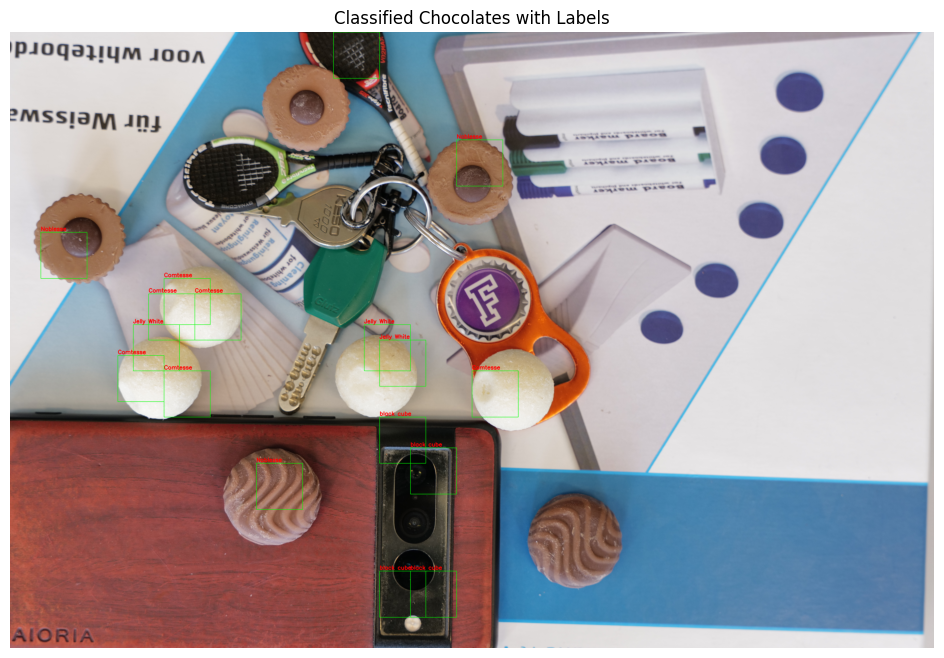

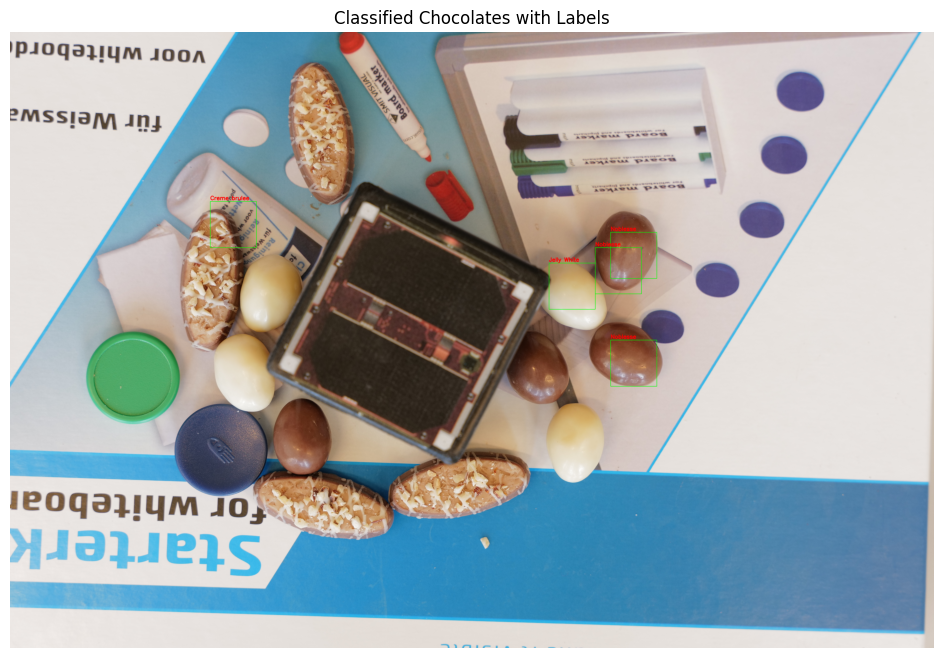

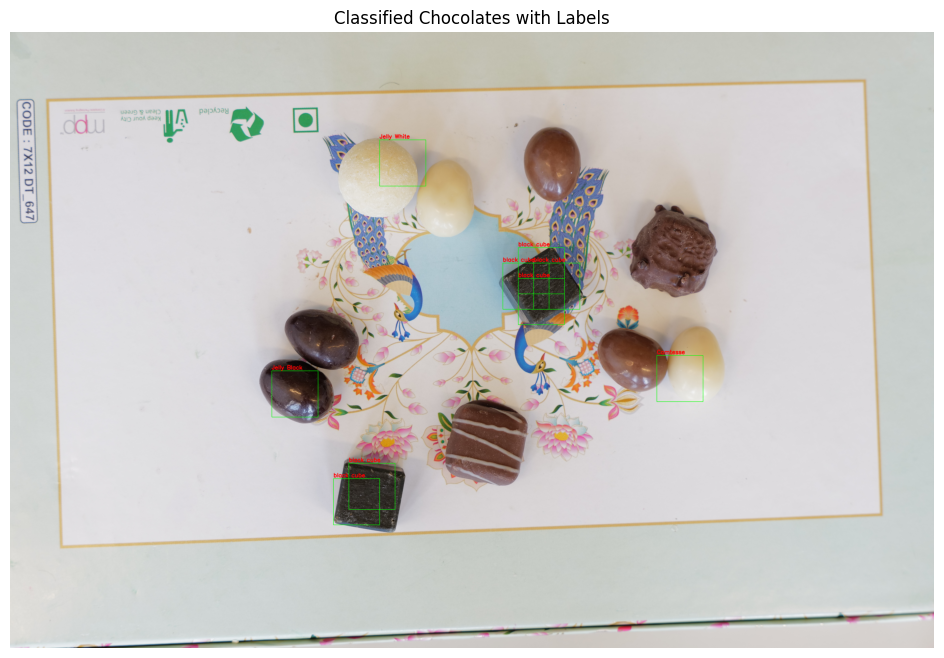

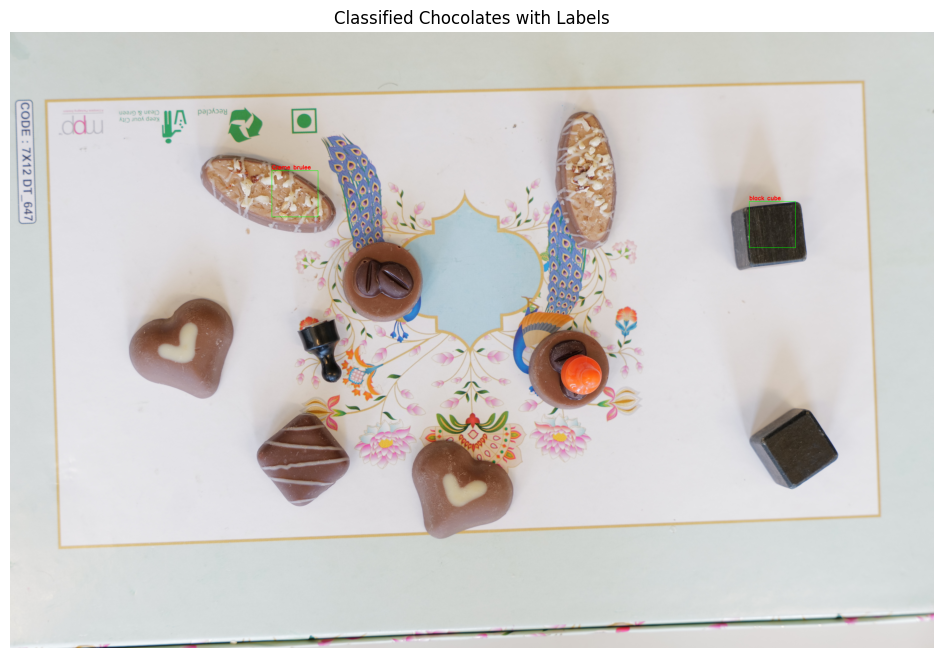

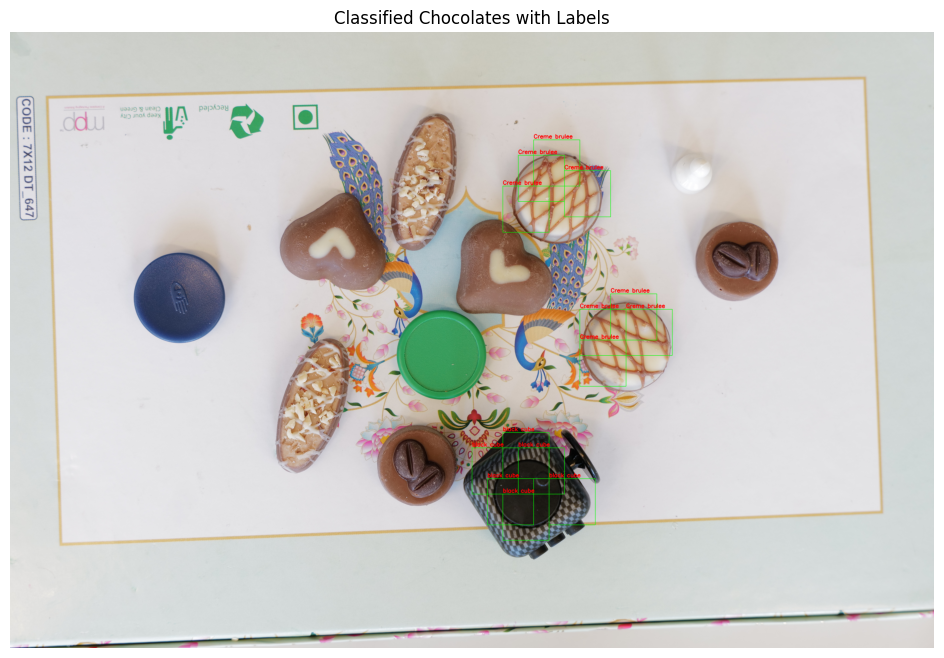

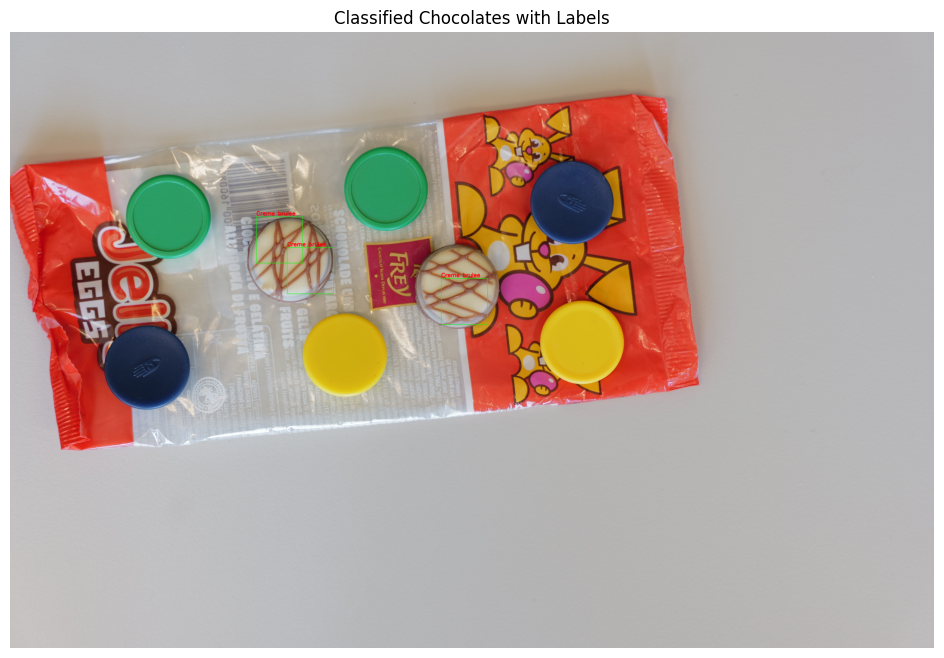

In [58]:
model = joblib.load(r'svm_model_slide.pkl')
test_folder = r'images\test_small'
for filename in os.listdir(test_folder):
    if filename.endswith('.JPG'):
        img_path = os.path.join(test_folder, filename)
        sliding_window_classification(img_path, model)

In [1]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from glob import glob
import pandas as pd
from collections import defaultdict
import itertools
import csv

In [2]:
def draw_contours(image, contours, labels=None):
    boxed = image.copy()
    for i, cnt in enumerate(contours):
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(boxed, (x, y), (x + w, y + h), (0, 255, 0), 3)
        if labels and i < len(labels):
            cv2.putText(boxed, labels[i], (x, y + 40), cv2.FONT_HERSHEY_SIMPLEX,
                        2.0, (0, 0, 255), 4, lineType=cv2.LINE_AA)
    return boxed



In [3]:
def kmeans_clustering(image, k=4):
    Z = image.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(Z)
    labels = kmeans.labels_.reshape(image.shape[:2])
    clustered_img = kmeans.cluster_centers_[labels].reshape(image.shape).astype(np.uint8)
    return clustered_img, labels

In [4]:
def choose_k_by_brightness(image, threshold=200):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mean_luminosity = np.mean(gray)
    return 2 if mean_luminosity > threshold else 4, mean_luminosity


In [5]:
def hue_vibrancy_score(hue):
    # Strongest vibrancy for red/yellow/orange/magenta
    if hue < 15 or hue > 160:
        return 1.0   # Red/Pink
    elif 15 <= hue <= 35:
        return 0.9   # Orange-Yellow
    elif 35 < hue <= 80:
        return 0.6   # Green
    elif 80 < hue <= 130:
        return 0.4   # Cyan-blue
    elif 130 < hue <= 160:
        return 0.5   # Purple
    else:
        return 0.2   # Default fallback


In [6]:
def choose_k_by_colorfulness(image, cluster_check_k=6, threshold=0.15):
    small = cv2.resize(image, (100, 100))
    Z = small.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=cluster_check_k, random_state=0).fit(Z)
    labels = kmeans.labels_
    centers = np.uint8(kmeans.cluster_centers_)

    hsv_centers = cv2.cvtColor(centers[np.newaxis, :, :], cv2.COLOR_BGR2HSV)[0]

    total_pixels = labels.shape[0]
    weighted_vibrancy = 0.0

    for idx, (h, s, v) in enumerate(hsv_centers):
        if s > 50:
            area_fraction = np.sum(labels == idx) / total_pixels
            vibrancy_score = hue_vibrancy_score(h)
            weighted_vibrancy += area_fraction * vibrancy_score

    chosen_k = 4 if weighted_vibrancy > threshold else 2
    return chosen_k, weighted_vibrancy


In [7]:
def extract_class_masks(labels, num_classes=4):
    masks = []
    for i in range(num_classes):
        mask = np.uint8(labels == i) * 255
        masks.append(mask)
    return masks

In [8]:
def clean_mask(mask):
    # Larger kernels to suppress small dots and merge nearby blobs
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))

    opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_open)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel_close)
    
    # Optional: strengthen structure further
    dilated = cv2.dilate(closed, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)), iterations=1)
    return dilated

In [9]:
def get_contours_from_mask(mask, min_area=1500, size_range=(200, 1200)):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered = []
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        if (min_area < cv2.contourArea(c) and size_range[0] <= w <= size_range[1] and size_range[0] <= h <= size_range[1]):
            filtered.append(c)
    return filtered

In [10]:
def extract_histogram(img, contour):
    x, y, w, h = cv2.boundingRect(contour)
    roi = img[y:y+h, x:x+w]
    hist = cv2.calcHist([roi], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
    cv2.normalize(hist, hist)
    return hist.flatten()

def match_histogram(hist, reference_histograms):
    return max(reference_histograms.items(), key=lambda item: cv2.compareHist(hist, item[1], cv2.HISTCMP_CORREL))[0]

def match_top_histograms(hist, reference_histograms, top_n=2):
    scores = []
    for class_name, ref_hist in reference_histograms.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        scores.append((class_name, score))
    scores.sort(key=lambda x: x[1], reverse=True)
    return scores[:top_n]

In [11]:
def load_reference_histograms_from_annotations(csv_path, train_folder):
    df = pd.read_csv(csv_path)

    # To store histograms per class
    histograms_by_class = defaultdict(list)

    for _, row in df.iterrows():
        filename = row['filename']
        img_path = os.path.join(train_folder, filename)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Failed to load image {img_path}")
            continue

        x_min, y_min, x_max, y_max = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
        cls = row['class']

        # Crop region and extract histogram
        roi = img[y_min:y_max, x_min:x_max]
        if roi.size == 0:
            print(f"Warning: Empty ROI for {filename} {cls}")
            continue

        hist = cv2.calcHist([roi], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
        cv2.normalize(hist, hist)
        histograms_by_class[cls].append(hist.flatten())

    # Compute mean histogram per class
    mean_histograms = {}
    for cls, hist_list in histograms_by_class.items():
        mean_hist = np.mean(hist_list, axis=0)
        mean_histograms[cls] = mean_hist

    print(f"Computed histograms for {len(mean_histograms)} classes.")
    return mean_histograms


In [12]:
# --------- Visualization ---------
def display_results(orig, clustered, contours, labels):
    clustered_boxes = draw_contours(clustered, contours)
    original_boxes = draw_contours(orig.copy(), contours)
    labeled_img = draw_contours(orig.copy(), contours, labels)

    fig, axs = plt.subplots(1, 3, figsize=(20, 8))  # Slightly larger figure
    axs[0].imshow(cv2.cvtColor(clustered_boxes, cv2.COLOR_BGR2RGB))
    axs[0].set_title('K-means with BBoxes', fontsize=24)
    axs[1].imshow(cv2.cvtColor(original_boxes, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Original with BBoxes', fontsize=24)
    axs[2].imshow(cv2.cvtColor(labeled_img, cv2.COLOR_BGR2RGB))
    axs[2].set_title('Final Classification', fontsize=24)

    for ax in axs:
        ax.axis('off')

    plt.tight_layout()
    plt.show()



In [13]:
# --------- Histogram Matching with Object Filtering ---------
def match_histogram_dual(hist, ref_chocolates, ref_objects):
    best_label = None
    best_score = -1

    # Compare to chocolate reference histograms
    for label, ref_hist in ref_chocolates.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        if score > best_score:
            best_score = score
            best_label = label
            best_from = 'chocolate'

    # Compare to object reference histograms
    for label, ref_hist in ref_objects.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        if score > best_score:
            best_score = score
            best_label = label
            best_from = 'object'

    # Only return label if it matched a chocolate, not an object
    return best_label if best_from == 'chocolate' else None


In [14]:
def match_histogram_dual_top(hist, ref_chocolates, ref_objects, top_n=2):
    chocolate_scores = []
    best_object_score = -1
    for label, ref_hist in ref_chocolates.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        chocolate_scores.append((label, score))
    for _, ref_hist in ref_objects.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        best_object_score = max(best_object_score, score)
    chocolate_scores.sort(key=lambda x: x[1], reverse=True)
    filtered_top = [entry for entry in chocolate_scores if entry[1] > best_object_score][:top_n]
    return filtered_top if filtered_top else None

In [20]:
def process_image_kmeans_only(img_path, reference_histograms, reference_histograms_objects, annotations_df, train_folder):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Failed to read image {img_path}")
        return

    k = choose_k_by_colorfulness(img)[0]
    clustered_img, labels = kmeans_clustering(img, k)
    class_masks = extract_class_masks(labels)
    all_contours = []
    all_labels = []

    for mask in class_masks:
        cleaned = clean_mask(mask)
        contours = get_contours_from_mask(cleaned)
        for cnt in contours:
            hist = extract_histogram(img, cnt)
            top_labels = match_histogram_dual_top(hist, reference_histograms, reference_histograms_objects)
            if not top_labels or len(top_labels) < 2:
                continue

            x, y, w, h = cv2.boundingRect(cnt)
            test_crop = img[y:y+h, x:x+w]
            test_clustered, _ = kmeans_clustering(test_crop, 4)
            test_gray = cv2.cvtColor(test_clustered, cv2.COLOR_BGR2GRAY)
            test_masks = extract_class_masks(test_gray)
            test_cnts = []
            for tm in test_masks:
                test_cnts.extend(get_contours_from_mask(tm))
            if not test_cnts:
                continue
            test_ref_cnt = max(test_cnts, key=cv2.contourArea)

            best_match_label = None
            best_shape_score = float('inf')

            for label, _ in top_labels:
                ref_row = annotations_df[annotations_df['class'] == label].iloc[0]
                ref_img_path = os.path.join(train_folder, ref_row['filename'])
                ref_img = cv2.imread(ref_img_path)
                x_min, y_min, x_max, y_max = map(int, [ref_row['xmin'], ref_row['ymin'], ref_row['xmax'], ref_row['ymax']])
                ref_crop = ref_img[y_min:y_max, x_min:x_max]
                ref_clustered, _ = kmeans_clustering(ref_crop, 4)
                ref_gray = cv2.cvtColor(ref_clustered, cv2.COLOR_BGR2GRAY)
                ref_masks = extract_class_masks(ref_gray)
                ref_cnts = []
                for rm in ref_masks:
                    ref_cnts.extend(get_contours_from_mask(rm))
                if not ref_cnts:
                    continue
                ref_main_cnt = max(ref_cnts, key=cv2.contourArea)

                shape_score = cv2.matchShapes(test_ref_cnt, ref_main_cnt, cv2.CONTOURS_MATCH_I1, 0.0)
                if shape_score < best_shape_score:
                    best_shape_score = shape_score
                    best_match_label = label

            if best_match_label:
                all_contours.append(cnt)
                all_labels.append(best_match_label)

    display_results(img, clustered_img, all_contours, all_labels)

In [16]:
ref_histograms = load_reference_histograms_from_annotations(r'data\_annotations_ref.csv', r'images\reference_images')
ref_object_histograms = load_reference_histograms_from_annotations(r'data\_annotations_objects.csv', r'images\train_total')

Computed histograms for 13 classes.
Computed histograms for 34 classes.


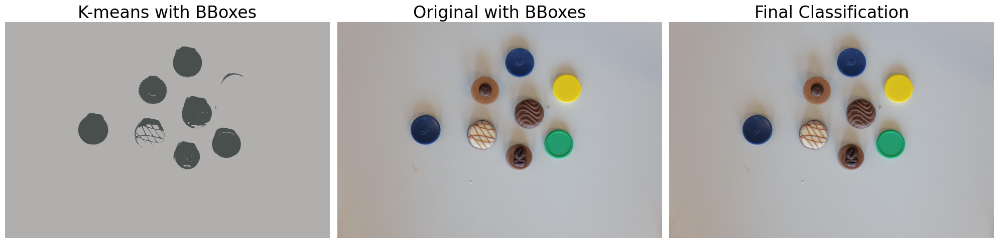

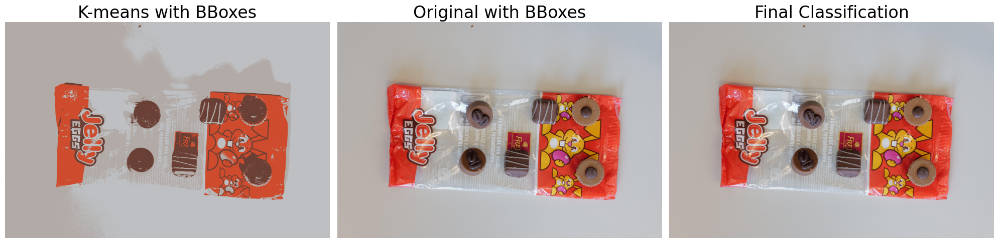

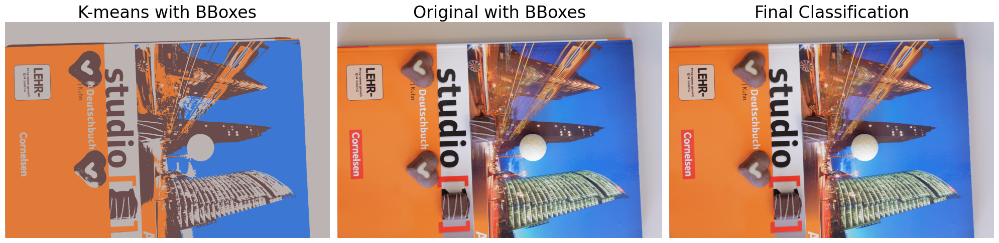

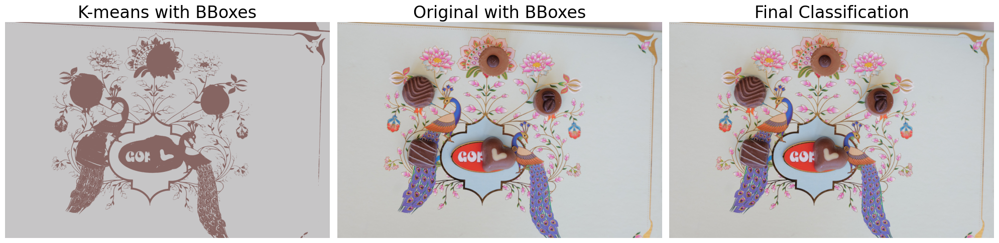

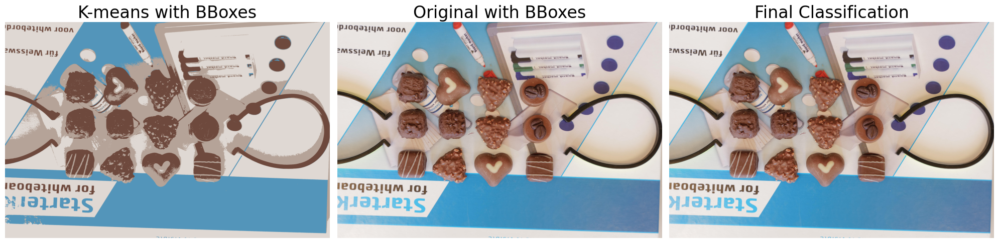

KeyboardInterrupt: 

In [21]:
test_folder = r'images\valid_small\diff_backgrounds'
ref_folder = r'images\reference_images'
annotations_df = pd.read_csv(r'data\_annotations_ref.csv')
for img_path in glob(os.path.join(test_folder, "*.jpg")):
    process_image_kmeans_only(img_path, ref_histograms, ref_object_histograms, annotations_df, ref_folder)

In [75]:
def disconnect_thin_structures(mask, erosion_iter=1, kernel_size=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    eroded = cv2.erode(mask, kernel, iterations=erosion_iter)
    return eroded


In [76]:
def get_all_contours_from_mask(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours


In [77]:
def display_results_with_debug(orig, clustered, contours, labels, raw_contours):
    clustered_with_filtered = draw_contours(clustered.copy(), contours)
    clustered_with_all = draw_contours(clustered.copy(), raw_contours)
    original_with_labels = draw_contours(orig.copy(), contours, labels)

    fig, axs = plt.subplots(1, 3, figsize=(24, 8))
    axs[0].imshow(cv2.cvtColor(clustered_with_all, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Clustered + All Contours', fontsize=18)

    axs[1].imshow(cv2.cvtColor(clustered_with_filtered, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Clustered + Filtered', fontsize=18)

    axs[2].imshow(cv2.cvtColor(original_with_labels, cv2.COLOR_BGR2RGB))
    axs[2].set_title('Original + Final Labels', fontsize=18)

    for ax in axs:
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [83]:
def process_image_kmeans_only_debug(img_path, reference_histograms, reference_histograms_objects):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Failed to read image {img_path}")
        return

    # Decide optimal k
    k = choose_k_by_colorfulness(img)[0]

    clustered_img, labels = kmeans_clustering(img, k)
    class_masks = extract_class_masks(labels)

    all_contours = []
    all_labels = []

    all_raw_contours = []  # Store all unfiltered contours for debug display

    for mask in class_masks:
        mask_disconnected = disconnect_thin_structures(mask)
        cleaned = clean_mask(mask_disconnected)
        raw_contours = get_all_contours_from_mask(cleaned) # change here
        all_raw_contours.extend(raw_contours)

        filtered_contours = get_contours_from_mask(cleaned)
        for cnt in filtered_contours:
            hist = extract_histogram(img, cnt)
            best_label = match_histogram_dual(hist, reference_histograms, reference_histograms_objects)
            if best_label:
                all_contours.append(cnt)
                all_labels.append(best_label)

    display_results_with_debug(img, clustered_img, all_contours, all_labels, all_raw_contours)


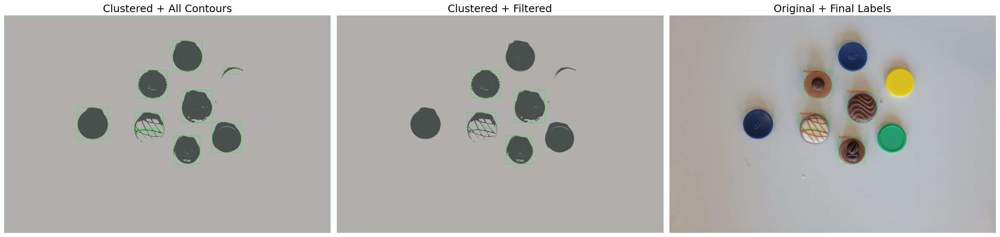

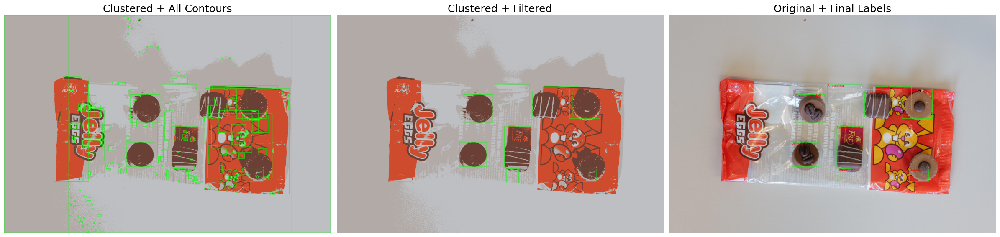

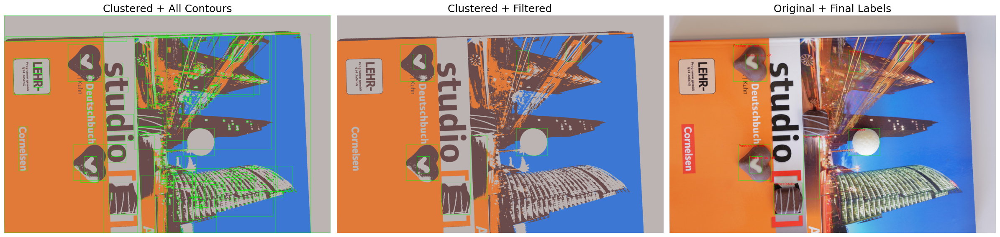

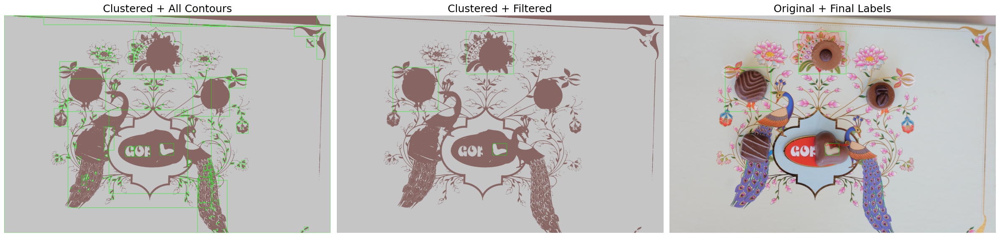

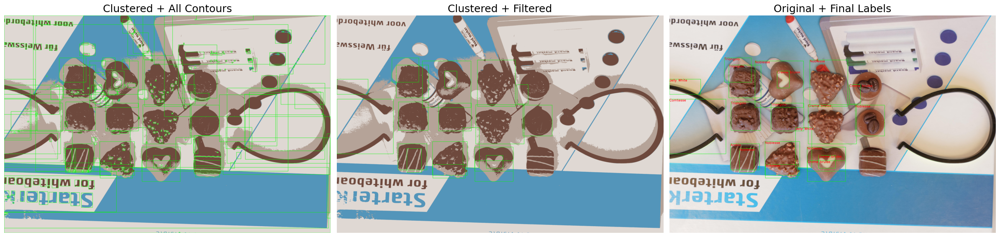

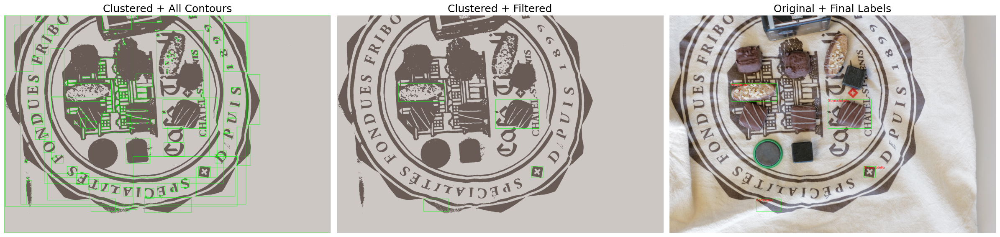

In [84]:
test_folder = r'images\valid_small\diff_backgrounds'
for img_path in glob(os.path.join(test_folder, "*.jpg")):
    process_image_kmeans_only_debug(img_path, ref_histograms, ref_object_histograms)

## Generate CSV

Must adapt the names, had to be done by hand

In [85]:
import itertools

def compute_overlap_ratio(box1, box2):
    # (x, y, w, h)
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert to x_min, y_min, x_max, y_max
    xa1, ya1, xa2, ya2 = x1, y1, x1 + w1, y1 + h1
    xb1, yb1, xb2, yb2 = x2, y2, x2 + w2, y2 + h2

    # Compute intersection
    xi1 = max(xa1, xb1)
    yi1 = max(ya1, yb1)
    xi2 = min(xa2, xb2)
    yi2 = min(ya2, yb2)

    iw = max(0, xi2 - xi1)
    ih = max(0, yi2 - yi1)
    inter_area = iw * ih

    area1 = w1 * h1
    area2 = w2 * h2
    overlap_ratio = inter_area / min(area1, area2) if min(area1, area2) > 0 else 0


    return overlap_ratio

def filter_overlapping_boxes(detections, overlap_thresh=0.1):
    keep = [True] * len(detections)

    for i, j in itertools.combinations(range(len(detections)), 2):
        if not keep[i] or not keep[j]:
            continue

        boxA = detections[i]['bbox']
        boxB = detections[j]['bbox']
        overlap = compute_overlap_ratio(boxA, boxB)

        if overlap >= overlap_thresh:
            # Compare scores
            if detections[i]['score'] >= detections[j]['score']:
                keep[j] = False
            else:
                keep[i] = False

    return [det for k, det in enumerate(detections) if keep[k]]




In [88]:
# Expected labels (MUST match what your `load_reference_histograms` returns!)
EXPECTED_LABELS = [
    "Jelly White", "Jelly Milk", "Jelly Black", "Amandina", "Creme brulee",
    "Triangolo", "Tentation noir", "Comtesse", "Noblesse", "Noir authentique",
    "Passion au lait", "Arabia", "Stracciatella"
]

In [89]:
# def process_image_for_counts(img_path, reference_histograms):
#     img = cv2.imread(img_path)
#     if img is None:
#         print(f"Error loading image: {img_path}")
#         return None

#     clustered_img, labels = kmeans_clustering(img, k=4)
#     class_masks = extract_class_masks(labels)

#     detected = []
#     detected = filter_overlapping_boxes(detected, overlap_thresh=0.1)


#     for mask in class_masks:
#         cleaned = clean_mask(mask)
#         contours = get_contours_from_mask(cleaned)
#         for cnt in contours:
#             x, y, w, h = cv2.boundingRect(cnt)
#             roi = img[y:y+h, x:x+w]
#             if roi.size == 0:
#                 continue
#             hist = extract_histogram(img, cnt)
#             best_label = match_histogram(hist, reference_histograms)
#             score = cv2.compareHist(hist, reference_histograms[best_label], cv2.HISTCMP_CORREL)
#             detected.append({
#                 'contour': cnt,
#                 'label': best_label,
#                 'score': score,
#                 'bbox': (x, y, x + w, y + h),
#             })

#     # --------- Overlap filtering ---------
#     keep = [True] * len(detected)
#     for i, j in itertools.combinations(range(len(detected)), 2):
#         if not keep[i] or not keep[j]:
#             continue
#         boxA, boxB = detected[i]['bbox'], detected[j]['bbox']
#         overlap = compute_overlap_ratio(boxA, boxB)
#         if overlap >= 0.1:
#             if detected[i]['score'] >= detected[j]['score']:
#                 keep[j] = False
#             else:
#                 keep[i] = False

#     # --------- Count final labels ---------
#     counts = {label: 0 for label in EXPECTED_LABELS}
#     for i, d in enumerate(detected):
#         if keep[i] and d['label'] in counts:
#             counts[d['label']] += 1

#     return counts


In [ ]:
def process_image_for_counts_updated(img_path, reference_histograms, reference_histograms_objects):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error loading image: {img_path}")
        return None

    # --- NEW: Choose k adaptively
    k = choose_k_by_colorfulness(img)[0]

    clustered_img, labels = kmeans_clustering(img, k)
    class_masks = extract_class_masks(labels, num_classes=k)

    detected = []

    for mask in class_masks:
        # --- NEW: Disconnect thin connections
        mask_disconnected = disconnect_thin_structures(mask)
        cleaned = clean_mask(mask_disconnected)

        contours = get_contours_from_mask(cleaned)
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)
            roi = img[y:y+h, x:x+w]
            if roi.size == 0:
                continue

            hist = extract_histogram(img, cnt)
            best_label = match_histogram_dual(hist, reference_histograms, reference_histograms_objects)

            if best_label:  # Only if matched to chocolate
                score = cv2.compareHist(hist, reference_histograms[best_label], cv2.HISTCMP_CORREL)
                detected.append({
                    'contour': cnt,
                    'label': best_label,
                    'score': score,
                    'bbox': (x, y, x + w, y + h),
                })

    # --------- Overlap filtering ---------
    keep = [True] * len(detected)
    for i, j in itertools.combinations(range(len(detected)), 2):
        if not keep[i] or not keep[j]:
            continue
        boxA, boxB = detected[i]['bbox'], detected[j]['bbox']
        overlap = compute_overlap_ratio(boxA, boxB)
        if overlap >= 0.1:
            if detected[i]['score'] >= detected[j]['score']:
                keep[j] = False
            else:
                keep[i] = False

    # --------- Count final labels ---------
    counts = {label: 0 for label in EXPECTED_LABELS}
    for i, d in enumerate(detected):
        if keep[i] and d['label'] in counts:
            counts[d['label']] += 1

    return counts


In [106]:
def generate_csv(test_folder, reference_histograms, reference_histograms_objects, output_csv):
    with open(output_csv, mode='w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['id'] + EXPECTED_LABELS)  # Header

        for img_path in glob(os.path.join(test_folder, '*.jpg')):
            filename = os.path.basename(img_path)

            # Extract image ID
            if filename.lower().startswith('l') and filename.lower().endswith('.jpg'):
                img_id = filename[1:filename.lower().rindex('.')]  # e.g., L1000757.JPG → 1000757
            else:
                print(f"Unexpected filename format: {filename}")
                continue

            # Use the updated version that accepts both histogram sets
            counts = process_image_for_counts_updated(img_path, reference_histograms, reference_histograms_objects)

            if counts is not None:
                row = [img_id] + [counts[label] for label in EXPECTED_LABELS]
                writer.writerow(row)
                print(f"Processed: {img_id}")


In [95]:
ref_histograms = load_reference_histograms_from_annotations(r'data\_annotations.csv', r'images\train_total')
ref_object_histograms = load_reference_histograms_from_annotations(r'data\_annotations_objects.csv', r'images\train_total')



Computed histograms for 13 classes.
Computed histograms for 34 classes.


In [107]:
generate_csv(
    test_folder=r'images\test',
    reference_histograms=ref_histograms,
    reference_histograms_objects=ref_object_histograms,
    output_csv='chocolate_counts_4.csv'
)

Processed: 1000757
Processed: 1000758
Processed: 1000759
Processed: 1000760
Processed: 1000761
Processed: 1000762
Processed: 1000764
Processed: 1000766
Processed: 1000767
Processed: 1000769
Processed: 1000770
Processed: 1000773
Processed: 1000774
Processed: 1000775
Processed: 1000776
Processed: 1000777
Processed: 1000778
Processed: 1000781
Processed: 1000782
Processed: 1000783
Processed: 1000784
Processed: 1000786
Processed: 1000789
Processed: 1000790
Processed: 1000794
Processed: 1000795
Processed: 1000796
Processed: 1000798
Processed: 1000800
Processed: 1000801
Processed: 1000806
Processed: 1000807
Processed: 1000809
Processed: 1000811
Processed: 1000813
Processed: 1000814
Processed: 1000816
Processed: 1000818
Processed: 1000819
Processed: 1000822
Processed: 1000823
Processed: 1000824
Processed: 1000825
Processed: 1000829
Processed: 1000830
Processed: 1000832
Processed: 1000833
Processed: 1000834
Processed: 1000835
Processed: 1000837
Processed: 1000839
Processed: 1000840
Processed: 1